In [20]:
#import libraries.
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

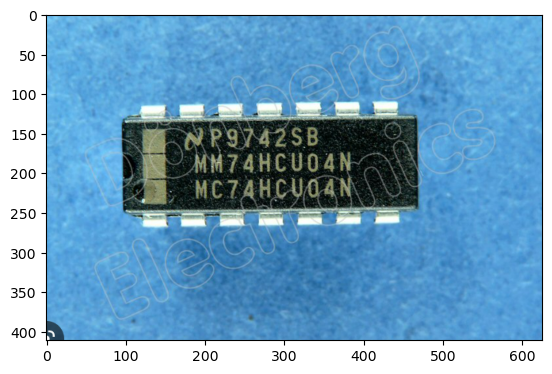

In [21]:
from skimage import data
from skimage.color import rgb2gray
import cv2

image = cv2.cvtColor(cv2.imread("C:/Users/ASUS/Desktop/ic_chips_images/images/frame2.png"), cv2.COLOR_BGR2RGB) 

plt.imshow(image)
plt.show()

In [5]:
#Bilateral filter.
from scipy.signal import gaussian
from scipy.stats import norm

def gaussian(x,sigma):
    return (1.0/(2*np.pi*(sigma**2)))*np.exp(-(x**2)/(2*(sigma**2)))

def distance(x1,y1,x2,y2):
    return np.sqrt(np.abs((x1-x2)**2-(y1-y2)**2))

def bilateral_filter(image, diameter, sigma_r, sigma_s):
    new_image = np.zeros(image.shape)

    for row in range(len(image)):
        for col in range(len(image[0])):
            wp_total = 0
            filtered_image = 0
            for k in range(diameter):
                for l in range(diameter):
                    n_x =row - (diameter/2 - k)
                    n_y =col - (diameter/2 - l)
                    if n_x >= len(image):
                        n_x -= len(image)
                    if n_y >= len(image[0]):
                        n_y -= len(image[0])
                    gi = gaussian(image[int(n_x)][int(n_y)] - image[row][col], sigma_r)
                    gs = gaussian(distance(n_x, n_y, row, col), sigma_s)
                    wp = gi * gs
                    filtered_image = (filtered_image) + (image[int(n_x)][int(n_y)] * wp)
                    wp_total = wp_total + wp
            filtered_image = filtered_image // wp_total
            new_image[row][col] = int(np.round(filtered_image))
    return new_image

In [5]:
from scipy.ndimage import gaussian_filter

image = cv2.imread("C:/Users/ASUS/Desktop/ic_chips_images/images/frame2.png", 0) # i download the original image as output.png
filtered_image_OpenCV = cv2.bilateralFilter(image, 7, 20.0, 20.0)
cv2.imwrite("filtered_image_OpenCV.png", filtered_image_OpenCV)
image_own = bilateral_filter(image, 7, 20.0, 20.0)
cv2.imwrite("filtered_image_own.png", image_own) # see in the attachement

C:\Users\ASUS\AppData\Local\Temp\ipykernel_12292\289901476.py:26: RuntimeWarning: overflow encountered in ubyte_scalars
  gi = gaussian(image[int(n_x)][int(n_y)] - image[row][col], sigma_r)


True

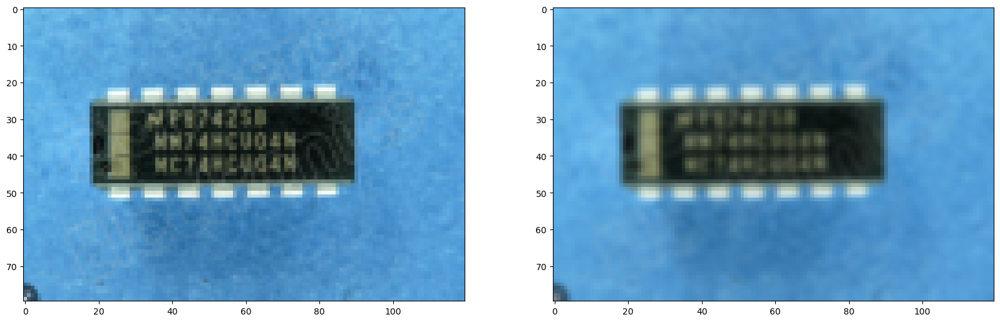

In [6]:
#Guassian filter.
from scipy.ndimage import convolve
from skimage.transform import resize


img = cv2.cvtColor(cv2.imread("C:/Users/ASUS/Desktop/ic_chips_images/images/frame2.png"), cv2.COLOR_BGR2RGB) 
img = resize(img, output_shape=(80, 120))
 
def gaussian_smoothing(image):
    image = cv2.GaussianBlur(image, (3, 3), 0)
    return image      
    

smoothed = gaussian_smoothing(img)

fig, axes = plt.subplots(figsize=(20, 12), ncols=2)

axes[0].imshow(img)
axes[1].imshow(smoothed)

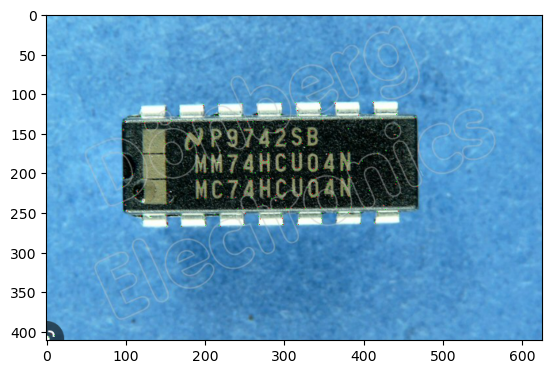

In [24]:
# Cornersubpix, corner detector.
import numpy as np
import cv2

# Load the image and convert to grayscale
img = cv2.imread('C:/Users/ASUS/Desktop/ic_chips_images/images/frame2.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find Harris corners as we did in the previous blog
gray = np.float32(gray)
dst = cv2.cornerHarris(gray, 2, 3, 0.04)
dst = cv2.dilate(dst, None)
ret, dst = cv2.threshold(dst, 0.01*dst.max(), 255, 0)
dst = np.uint8(dst)

# find centroids
ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)

# define the criteria to stop. We stop it after a specified number of iterations
# or a certain accuracy is achieved, whichever occurs first.
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)

# Refine the corners using cv2.cornerSubPix()
corners = cv2.cornerSubPix(gray, np.float32(centroids), (5, 5), (-1, -1), criteria)

# To display, first convert the centroids and corners to integer
centroids = np.int0(centroids)
corners = np.int0(corners)

# then i have used red color to mark Harris Corners
# and green color to mark refined corners
img[centroids[:, 1], centroids[:, 0] ]= [0, 0, 255]
img[corners[:, 1], corners[:, 0]] = [0, 255, 0]

# Write the image at the desired location
cv2.imwrite('C:/Users/ASUS/Desktop/ic_chips_images/ic_chips + features + recognition/ic_chips/output_cornerdetector.png', img)
image_corner = cv2.cvtColor(cv2.imread('C:/Users/ASUS/Desktop/ic_chips_images/ic_chips + features + recognition/ic_chips/output_cornerdetector.png'), cv2.COLOR_BGR2RGB)
plt.imshow(image_corner)
plt.show()

In [9]:
#Canny detection.
#This cell contains all the used functions for Phase 1 

#Define RGB2gray function
import imageio
from scipy import ndimage

def rgb2gray(img) :
    return np.dot(img[..., :3], [0.2989, 0.5870, 0.1140])


#Detemine gradient function for Fx and Fy using sobel filter(normlized)
def gradient_x(img) :
    grad_img = ndimage.convolve(img, np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]]))
    return grad_img/np.max(grad_img)

def gradient_y(img) :
    grad_img = ndimage.convolve(img, np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]]))
    return grad_img/np.max(grad_img)


#Define gradient magnitude function
def gradient_mag(fx, fy) :
    grad_mag = np.hypot(fx, fy)
    return grad_mag/np.max(grad_mag)

In [10]:
#This cell contains all functions used in Phase 2

#2.a : Find closest direction D*
def closest_dir_function(grad_dir) :
    closest_dir_arr = np.zeros(grad_dir.shape)
    for i in range(1, int(grad_dir.shape[0] - 1)) :
        for j in range(1, int(grad_dir.shape[1] - 1)) :
            
            if((grad_dir[i, j] > -22.5 and grad_dir[i, j] <= 22.5) or (grad_dir[i, j] <= -157.5 and grad_dir[i, j] > 157.5)) :
                closest_dir_arr[i, j] = 0
                
            elif((grad_dir[i, j] > 22.5 and grad_dir[i, j] <= 67.5) or (grad_dir[i, j] <= -112.5 and grad_dir[i, j] > -157.5)) :
                closest_dir_arr[i, j] = 45
                
            elif((grad_dir[i, j] > 67.5 and grad_dir[i, j] <= 112.5) or (grad_dir[i, j] <= -67.5 and grad_dir[i, j] > -112.5)) : 
                closest_dir_arr[i, j] = 90
                
            else:
                closest_dir_arr[i, j] = 135
                
    return closest_dir_arr


#2.b : Convert to thinned edge
def non_maximal_suppressor(grad_mag, closest_dir) :
    thinned_output = np.zeros(grad_mag.shape)
    for i in range(1, int(grad_mag.shape[0] - 1)) :
        for j in range(1, int(grad_mag.shape[1] - 1)) :
            
            if(closest_dir[i, j] == 0) :
                if((grad_mag[i, j] > grad_mag[i, j+1]) and (grad_mag[i, j] > grad_mag[i, j-1])) :
                    thinned_output[i, j] = grad_mag[i, j]
                else :
                    thinned_output[i, j] = 0
            
            elif(closest_dir[i, j] == 45) :
                if((grad_mag[i, j] > grad_mag[i+1, j+1]) and (grad_mag[i, j] > grad_mag[i-1, j-1])) :
                    thinned_output[i, j] = grad_mag[i, j]
                else :
                    thinned_output[i, j] = 0
            
            elif(closest_dir[i, j] == 90) :
                if((grad_mag[i, j] > grad_mag[i+1, j]) and (grad_mag[i, j] > grad_mag[i-1, j])) :
                    thinned_output[i, j] = grad_mag[i, j]
                else :
                    thinned_output[i, j] = 0
            
            else :
                if((grad_mag[i, j] > grad_mag[i+1, j-1]) and (grad_mag[i, j] > grad_mag[i-1, j+1])) :
                    thinned_output[i, j] = grad_mag[i, j]
                else :
                    thinned_output[i, j] = 0
            
    return thinned_output/np.max(thinned_output)  

In [11]:
#This cell contains all the used functionsfor Phase III

#Function to include weak pixels that are connected to chain of strong pixels 
def DFS(img) :
    for i in range(1, int(img.shape[0] - 1)) :
        for j in range(1, int(img.shape[1] - 1)) :
            if(img[i, j] == 1) :
                t_max = max(img[i-1, j-1], img[i-1, j], img[i-1, j+1], img[i, j-1],
                            img[i, j+1], img[i+1, j-1], img[i+1, j], img[i+1, j+1])
                if(t_max == 2) :
                    img[i, j] = 2
                
                    
#Hysteresis Thresholding
def hysteresis_thresholding(img) :
    low_ratio = 0.10
    high_ratio = 0.30
    diff = np.max(img) - np.min(img)
    t_low = np.min(img) + low_ratio * diff
    t_high = np.min(img) + high_ratio * diff
    
    temp_img = np.copy(img)
    
    #Assign values to pixels
    for i in range(1, int(img.shape[0] - 1)) :
        for j in range(1, int(img.shape[1] - 1)) :
            #Strong pixels
            if(img[i, j] > t_high) :
                temp_img[i, j] = 2
            #Weak pixels
            elif(img[i, j] < t_low) :
                temp_img[i, j] = 0
            #Intermediate pixels
            else :
                temp_img[i, j] = 1
    
    #Include weak pixels that are connected to chain of strong pixels 
    total_strong = np.sum(temp_img == 2)
    while(1) :
        DFS(temp_img)
        if(total_strong == np.sum(temp_img == 2)) :
            break
        total_strong = np.sum(temp_img == 2)
    
    #Remove weak pixels
    for i in range(1, int(temp_img.shape[0] - 1)) :
        for j in range(1, int(temp_img.shape[1] - 1)) :
            if(temp_img[i, j] == 1) :
                temp_img[i, j] = 0
    
    temp_img = temp_img/np.max(temp_img)
    return temp_img   

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25836\4265304015.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  input_img = imageio.imread(input_path)


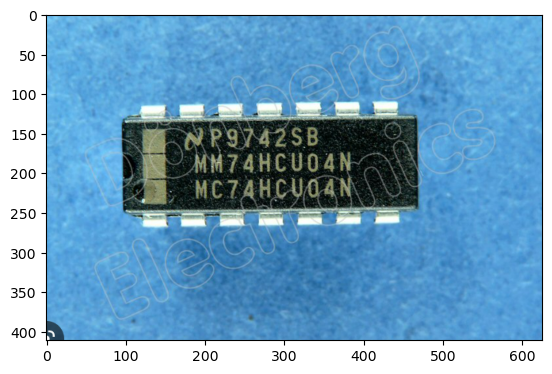

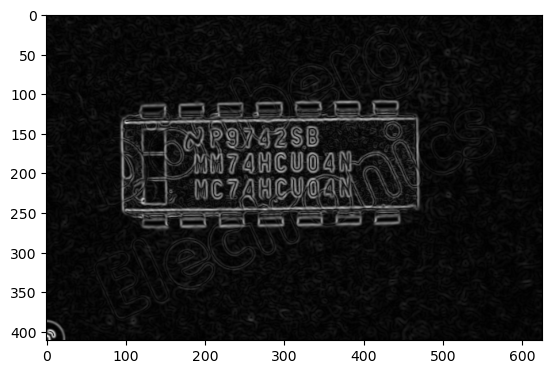

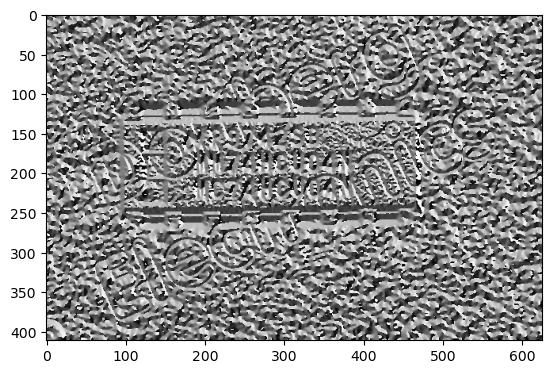

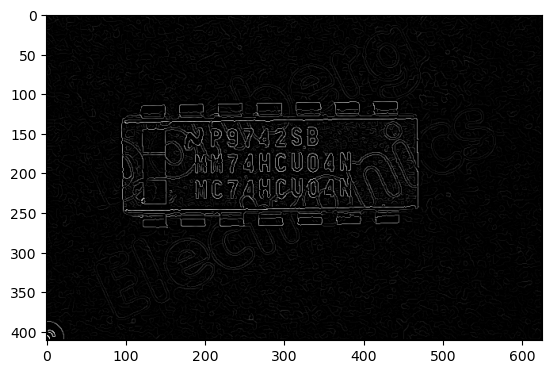

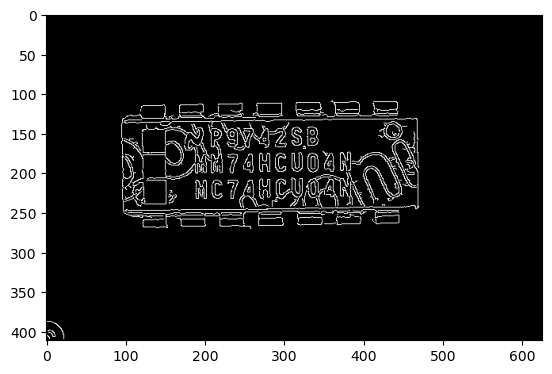

...

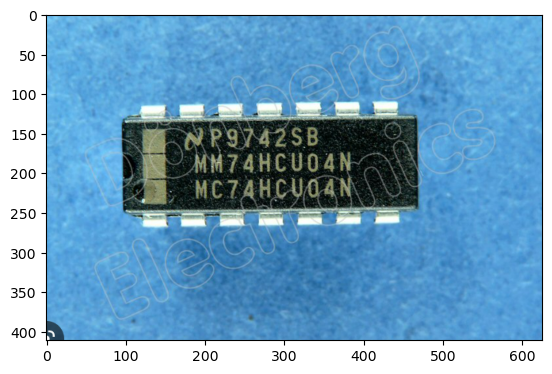

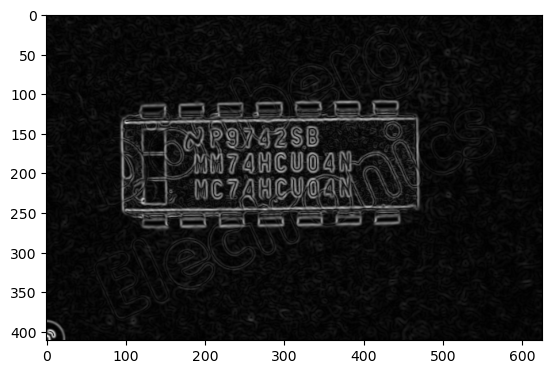

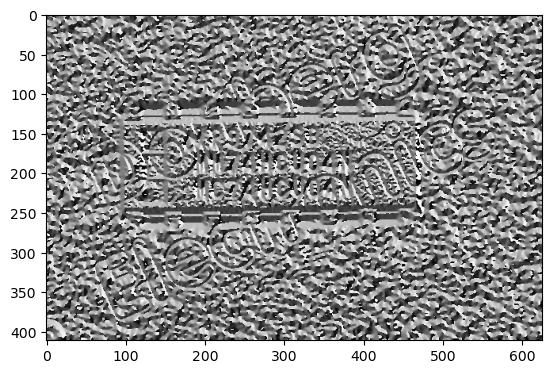

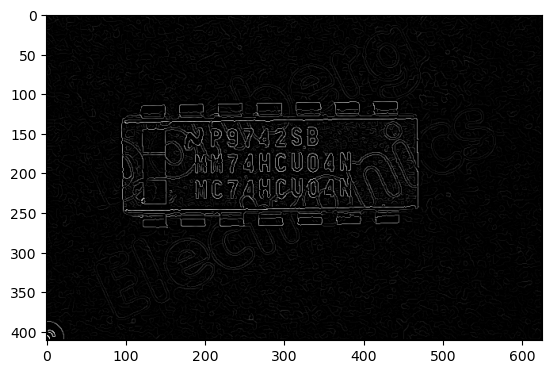

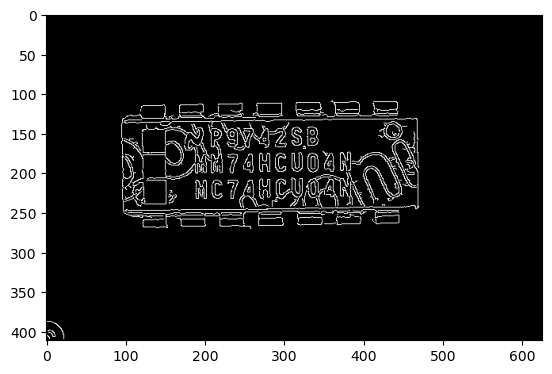

In [12]:
#Canny Edge Detector Implementation and test

input_path = "C:/Users/ASUS/Desktop/ic_chips_images/images/frame2.png"
output_path = "C:/Users/ASUS/Desktop/ic_chips_images/label/"
img_name = "frame2.png"

#Load the input images
for img in img_name :
    input_img = imageio.imread(input_path)
    plt.imshow(input_img)
    plt.show()
    
    #Convert the image to grayscale
    gray_input_img = rgb2gray(input_img)
    
    #Apply gaussian blurring
    blur_img = ndimage.gaussian_filter(gray_input_img, sigma = 1.0)
    
    #Find gradient Fx
    x_grad = gradient_x(blur_img)
    
    #Find gradient Fy
    y_grad = gradient_y(blur_img)

    #Compute edge strength
    grad_mag = gradient_mag(x_grad, y_grad)
    plt.imshow(grad_mag, cmap = plt.get_cmap('gray'))
    plt.show()
    
    
    #Compute direction of gradient
    grad_dir = np.degrees(np.arctan2(y_grad, x_grad))
    plt.imshow(grad_dir, cmap = plt.get_cmap('gray'))
    plt.show()
    
    
    
    #Phase 2 : Non maximal suppression
    closest_dir = closest_dir_function(grad_dir)
    thinned_output = non_maximal_suppressor(grad_mag, closest_dir)
    plt.imshow(thinned_output, cmap = plt.get_cmap('gray'))
    plt.show()
    
   

    #Phase 3 : Hysteresis Thresholding
    output_img = hysteresis_thresholding(thinned_output)
    plt.imshow(output_img, cmap = plt.get_cmap('gray'))
    plt.show()


(411, 626)

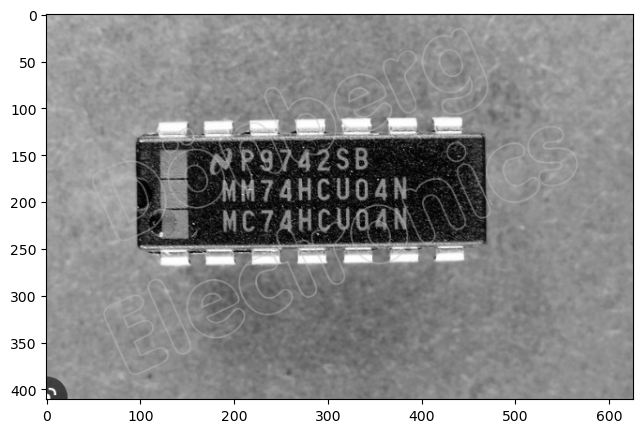

In [3]:
from skimage.data import page

img = cv2.cvtColor(cv2.imread("C:/Users/ASUS/Desktop/ic_chips_images/images/frame2.png"), cv2.COLOR_BGR2GRAY)


fig, ax = plt.subplots(figsize=(10, 5))
ax.imshow(img, cmap='gray')

img.shape 

Text(0, 0.5, 'Bin count')

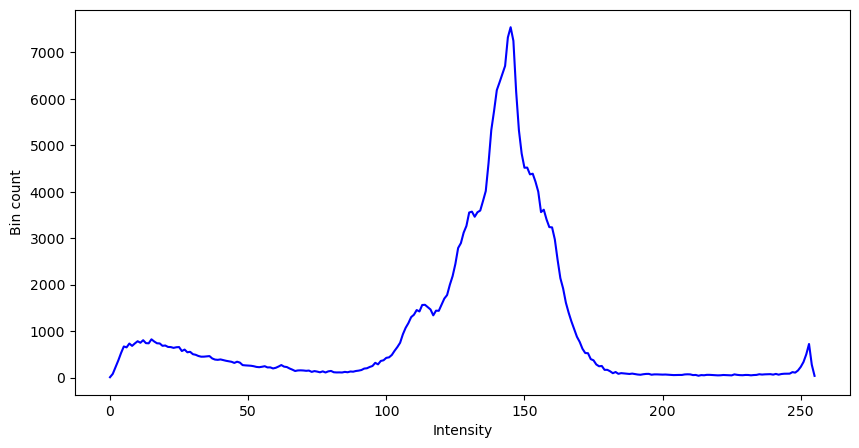

In [4]:
# otsu algorithms, and first find threshold.
hist = np.bincount(img.flatten())

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(hist, color='blue')
ax.set_xlabel('Intensity')
ax.set_ylabel('Bin count')


In [5]:
w_0 = np.cumsum(hist) / np.sum(hist)
w_1 = 1 - w_0

In [6]:
num_val = len(hist)
probs = hist / np.sum(hist)
weighted_sums = np.cumsum(np.arange(num_val) * probs)

mu_0 = weighted_sums / w_0
mu_1 = (weighted_sums[-1] - weighted_sums) / w_1

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8408\1095867551.py:6: RuntimeWarning: invalid value encountered in true_divide
  mu_1 = (weighted_sums[-1] - weighted_sums) / w_1


In [7]:
max_var = -float('inf')
T = None

for t in range(num_val - 1):

    var = w_0[t] * w_1[t] * (mu_0[t] - mu_1[t]) ** 2

    if var > max_var:
        max_var = var
        T = t

print(f'Otsu threshold: {T}')

Otsu threshold: 87


In [8]:
from ipywidgets import interact, widgets
from IPython.display import display

hist = np.bincount(img.flatten())
masks = [img < threshold for threshold in range(255)]

def f_display(threshold):
    fig, axes = plt.subplots(figsize=(15, 3), ncols=2)
    axes[0].imshow(masks[threshold], cmap='gray')
    axes[1].plot(hist, color='blue')
    axes[1].axvline(threshold, color='red', linestyle='--')

interact(f_display, threshold=widgets.IntSlider(min=0, max=255, step=1, value=T))




interactive(children=(IntSlider(value=87, description='threshold', max=255), Output()), _dom_classes=('widget-…

<function __main__.f_display(threshold)>

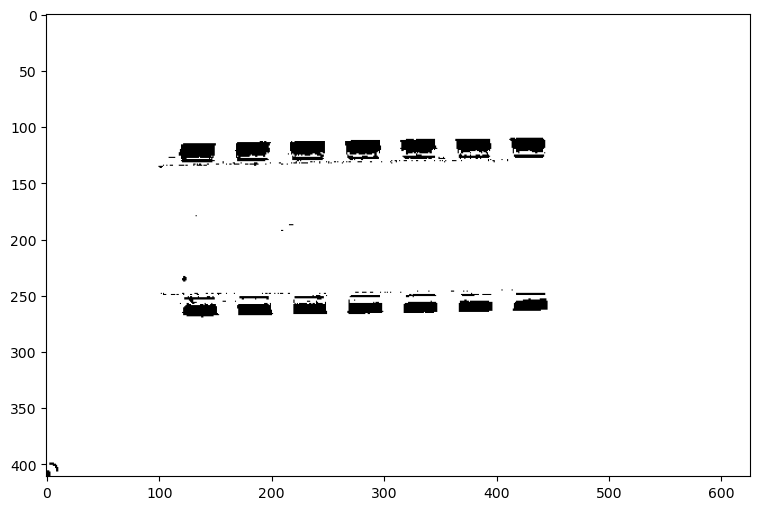

In [85]:
hist = np.bincount(img.flatten())
masks = [img < threshold for threshold in range(255)]

def f_display(threshold):
    plt.subplots(figsize=(12, 6))
    plt.imshow(masks[threshold], cmap='gray')
    

figure = f_display(191)
#save image to the files.